Open statement/Introduction

In this project, the comprehensive Zomato dataset is explored to analyze and predict the average cost for two and the price range of restaurants, offering insights into the culinary landscape across various global locales. Through meticulous data exploration, preprocessing, and model development, patterns and trends are uncovered to guide food enthusiasts and restaurateurs in making informed decisions.

1. Import Required Libraries and Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from wordcloud import WordCloud
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, confusion_matrix, mean_absolute_error
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

2. Exploratory Data Analysis (EDA) and Preprocessing

In [2]:
#Load your dataset:
zomato_df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset4/main/zomato.csv', encoding='latin1')
country_code_df = pd.read_excel(r"C:\Users\brandyonyi\OneDrive\Desktop\Country-Code.xlsx")

# Merge the datasets
df = pd.merge(zomato_df, country_code_df, on='Country Code')

In [3]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines


Restaurants in the dataset offer a diverse range of cuisines, including Japanese, French, Desserts, Seafood, Asian, Filipino, Indian, Sushi, and Korean, with aggregate ratings ranging from 4.4 to 4.9, indicating a spectrum from very good to excellent dining experiences.

Key attributes highlighted in the dataset include the availability of table booking, with a noted absence of online delivery services for most listed establishments, alongside geographical coordinates for precise location identification.

Customer feedback, as evidenced by the 'Votes' column, varies significantly among the restaurants, ranging from 229 to 591 votes, suggesting a substantial engagement from patrons and affirming the quality of dining experiences offered.

In [4]:
#Concise summary of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

The dataset comprises 9,551 restaurant listings, detailed across 22 columns with a mix of numerical (int64, float64) and textual (object) data types, covering aspects from identification and location to services, pricing, and customer feedback

In [5]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


The dataset contains 9,551 restaurant listings, with a wide range of Country Codes from 1 to 216, indicating a global span of data; geographical coordinates (Longitude and Latitude) suggest a broad distribution, spanning from -157.95 to 174.83 in longitude and -41.33 to 55.98 in latitude.

The Average Cost for two varies significantly, ranging from 0 to 800,000 with a mean of 1,199.21, highlighting the diverse dining cost spectrum covered, from budget-friendly to high-end establishments.

The Price range column, likely indicating a categorization from low to high, spans from 1 to 4, with most restaurants falling into the lower half of this range (mean of 1.8), suggesting a predominance of more affordably priced dining options.

Customer engagement and satisfaction, as measured by Votes and Aggregate rating, show wide variability; ratings range from 0.0 to 4.9 (mean of 2.67), with votes per restaurant ranging from 0 to 10,934, reflecting a diverse array of customer experiences and perceptions.

In [6]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
Country                 0
dtype: int64

The dataset on restaurant listings is complete across all fields except for 'Cuisines', which has 9 missing entries, indicating nearly universal data completeness with a minor gap in detailing the type of food served by a few restaurants.

In [7]:
# Using the Most Frequent Category to handle missing values
most_frequent = df['Cuisines'].mode()[0]
df['Cuisines'].fillna(most_frequent, inplace=True)

In [8]:
has_nan = df.isnull().values.any()
print(f"Are there any NaN values in the DataFrame? {has_nan}")

Are there any NaN values in the DataFrame? False


In [9]:
# List of numerical columns
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
print("Numerical columns:")
print(numerical_cols)

# List of categorical columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
print("\nCategorical columns:")
print(categorical_cols)

Numerical columns:
Index(['Restaurant ID', 'Country Code', 'Longitude', 'Latitude',
       'Average Cost for two', 'Price range', 'Aggregate rating', 'Votes'],
      dtype='object')

Categorical columns:
Index(['Restaurant Name', 'City', 'Address', 'Locality', 'Locality Verbose',
       'Cuisines', 'Currency', 'Has Table booking', 'Has Online delivery',
       'Is delivering now', 'Switch to order menu', 'Rating color',
       'Rating text', 'Country'],
      dtype='object')


3. Visualization of dataset

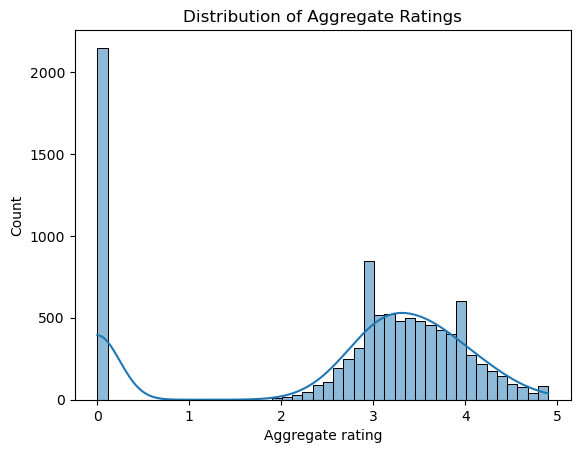

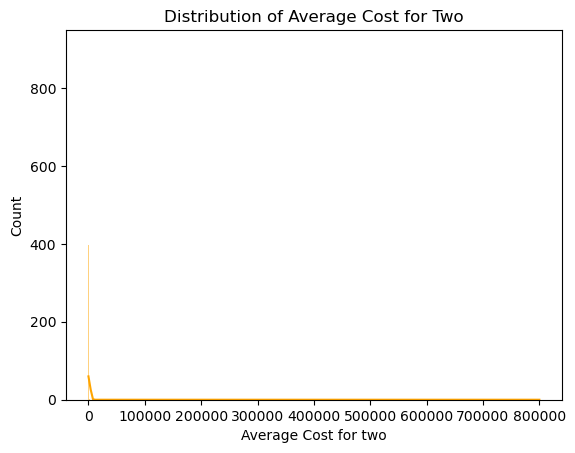

In [10]:
# Distribution of Ratings and Costs

# Aggregate Rating
sns.histplot(data=df, x='Aggregate rating', kde=True)
plt.title('Distribution of Aggregate Ratings')
plt.show()

# Average Cost for two
sns.histplot(data=df, x='Average Cost for two', kde=True, color='orange')
plt.title('Distribution of Average Cost for Two')
plt.show()

# Aggregate Rating
The histogram shows the distribution of aggregate ratings for restaurants in a dataset, with ratings ranging from 0 to 5.

A significant number of restaurants have received a rating of 0, which could indicate a large number of unrated or possibly newly listed establishments.

The distribution of non-zero ratings appears to be bimodal, with peaks around ratings of 3 and 4.5, suggesting two common groupings where restaurants are rated as good or excellent.

Ratings between 4 and 5 are less frequent but still significant, while very few restaurants have ratings just above 0, indicating that establishments with ratings tend to score higher rather than lower.

# Average Cost for two
The histogram illustrates the distribution of the average cost for two people at various restaurants, showing that most of the restaurants are clustered at the lower end of the cost spectrum.

A vast majority of restaurants have an average cost for two that appears to be below 50,000, suggesting that affordable dining options predominate in this dataset.

There is an extreme outlier or possibly a small number of outliers with an average cost for two that significantly skews the distribution, with values reaching up to 800,000.

The x-axis is greatly extended due to these outliers, which indicates that while most restaurants are budget-friendly, a few establishments are exceptionally high-priced.

In [11]:
# Geographical Insights
import folium

map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=2)

for _, restaurant in df.iterrows():
    folium.CircleMarker(
        location=[restaurant['Latitude'], restaurant['Longitude']],
        radius=3,
        popup=restaurant['Restaurant Name'],
        color='blue',
        fill=True,
        fill_color='blue').add_to(map)

map

The world map visualization displays the geographical distribution of restaurants in the dataset, with clusters of data points mainly in India, as well as scattered points across other regions.

There is a high concentration of restaurants in the northern and southern parts of India, with dense clusters appearing in and around major cities.

Outside of India, there are various isolated points indicating individual or smaller groups of restaurants spread across different continents including North America, Europe, Asia, Africa, and Oceania.

The spread of data points suggests that the dataset includes international restaurant listings, but with a significant emphasis on India.

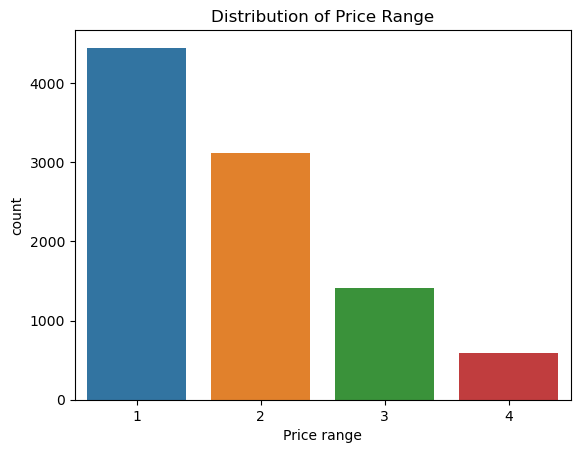

In [12]:
# Price Range Distribution
sns.countplot(data=df, x='Price range')
plt.title('Distribution of Price Range')
plt.show()

The bar graph depicts the distribution of restaurants across four different price ranges, with the majority of restaurants falling into the lowest price range (1).

The count of restaurants decreases as the price range increases, with price range 2 having fewer restaurants than price range 1, and even fewer establishments in price range 3.

The highest price range (4) has the smallest number of restaurants, indicating that establishments in this price category are the least common within the dataset.

The overall trend suggests that lower-priced restaurants are more prevalent than higher-priced ones in this particular collection of data.

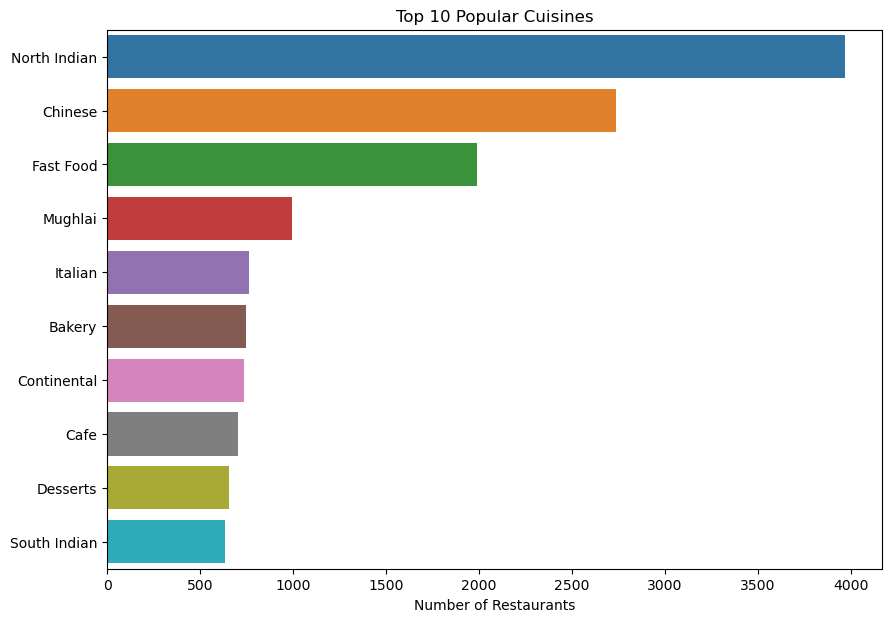

In [13]:
# Cuisine Popularity
cuisine_counts = Counter(", ".join(df['Cuisines'].dropna()).split(", "))
top_cuisines = dict(cuisine_counts.most_common(10))

plt.figure(figsize=(10, 7))
sns.barplot(x=list(top_cuisines.values()), y=list(top_cuisines.keys()))
plt.title('Top 10 Popular Cuisines')
plt.xlabel('Number of Restaurants')
plt.show()

The horizontal bar chart ranks the top 10 popular cuisines in a dataset, with North Indian cuisine being the most common, followed by Chinese and Fast Food.

Mughlai and Italian cuisines also feature prominently, indicating a diverse taste preference among the dataset's audience.

The presence of Bakery, Continental, Cafe, and Desserts shows a wide range of dining options, from casual to specialty foods.

South Indian cuisine, while popular, is the least represented among the top 10 cuisines in this particular dataset.

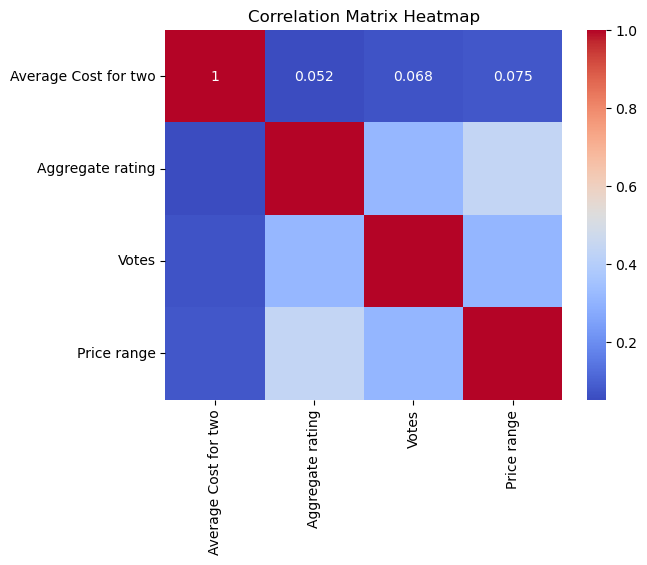

In [14]:
# Correlation Heatmap
features = ['Average Cost for two', 'Aggregate rating', 'Votes', 'Price range']
correlation_matrix = df[features].corr()

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')
plt.show()

The heatmap displays the correlation matrix for four variables: Average Cost for two, Aggregate rating, Votes, and Price range, with a correlation coefficient scale from -1.0 (perfect negative correlation) to 1.0 (perfect positive correlation).

The Average Cost for two has a very low positive correlation with Aggregate rating (0.052) and Price range (0.075), suggesting that a higher cost doesn't necessarily correspond to a higher rating or price category.

Votes have a moderate positive correlation with Aggregate rating (0.068), indicating that restaurants with higher ratings tend to have a larger number of votes, though the correlation is not strong.

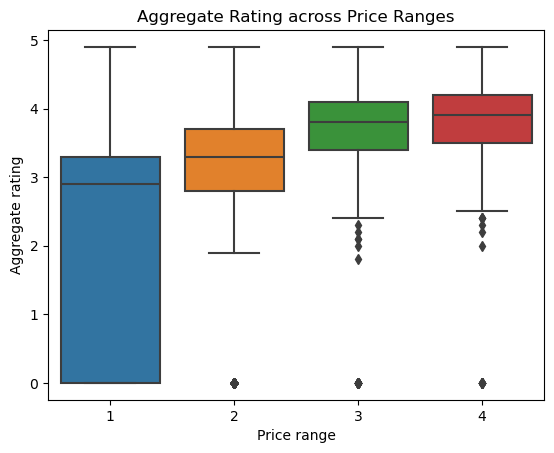

In [15]:
# Boxplots for Price Range and Ratings
sns.boxplot(data=df, x='Price range', y='Aggregate rating')
plt.title('Aggregate Rating across Price Ranges')
plt.show()

The boxplot visualizes aggregate ratings across four price ranges, indicating that there is some variation in ratings within each price range, but not a clear increasing or decreasing trend.

Price range 1 shows the widest range of ratings, from the lowest to almost the highest in the dataset, suggesting that this category has a diverse set of ratings.

Price ranges 2 through 4 appear to have a tighter distribution of ratings with the median rating slightly increasing with the price range, hinting at a possible correlation between higher prices and slightly higher median ratings.

All price ranges show outliers indicated by diamonds below the main clusters, representing restaurants that are rated significantly lower than others within their price category.

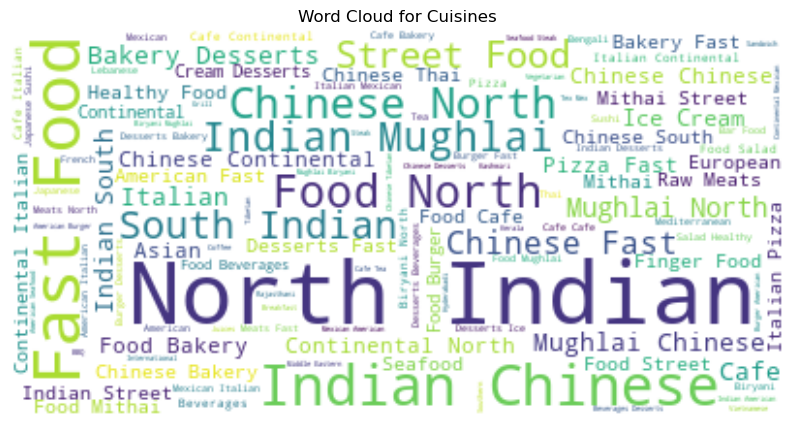

In [16]:
# Word Clouds for Cuisines and Localities
cuisine_text = ", ".join(df['Cuisines'].dropna())
cuisine_wordcloud = WordCloud(background_color='white').generate(cuisine_text)

plt.figure(figsize=(10, 7))
plt.imshow(cuisine_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Cuisines')
plt.show()

The word cloud highlights the most popular cuisines in a dataset, with "North Indian" and "Chinese" appearing to be the most frequent as indicated by their larger font size.

"Fast Food," "South Indian," and "Street Food" are also prominently featured, suggesting these are common options available in the restaurants represented in the data.

Cuisines such as "Italian," "Cafe," and "Mughlai" are mentioned with moderate frequency, indicating a decent representation within the dataset.

The diversity of cuisines is underscored by the presence of various other types, including "Continental," "Desserts," "Bakery," and "Asian," reflecting a wide range of culinary offerings.

4. Preprocessing and Feature Engineering

In [17]:
# List of numerical columns
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
print("Numerical columns:")
print(numerical_cols)

# List of categorical columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
print("\nCategorical columns:")
print(categorical_cols)

Numerical columns:
Index(['Restaurant ID', 'Country Code', 'Longitude', 'Latitude',
       'Average Cost for two', 'Price range', 'Aggregate rating', 'Votes'],
      dtype='object')

Categorical columns:
Index(['Restaurant Name', 'City', 'Address', 'Locality', 'Locality Verbose',
       'Cuisines', 'Currency', 'Has Table booking', 'Has Online delivery',
       'Is delivering now', 'Switch to order menu', 'Rating color',
       'Rating text', 'Country'],
      dtype='object')


In [18]:
# Creating new features

# Popularity Score to combine 'Aggregate rating' and 'Votes' to reflect both the quality of the rating and the quantity of reviews
df['Popularity Score'] = df['Aggregate rating'] * np.log1p(df['Votes'])

# Cuisine Count
df['Cuisine Count'] = df['Cuisines'].apply(lambda x: len(x.split(', ')) if pd.notnull(x) else 0)

# Transform 'Has Table booking', 'Has Online delivery', 'Is delivering now', and 'Switch to order menu' from 'Yes'/'No' to binary (1/0)
binary_columns = ['Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu']
df[binary_columns] = df[binary_columns].apply(lambda x: x.map({'Yes': 1, 'No': 0}))

# Rating Category
bins = [0, 2.5, 3.5, 5]
labels = ['Low', 'Medium', 'High']
df['Rating Category'] = pd.cut(df['Aggregate rating'], bins=bins, labels=labels, include_lowest=True)

unique_countries = df['Country'].unique()
print(unique_countries)

['Phillipines' 'Brazil' 'United States' 'Australia' 'Canada' 'Singapore'
 'UAE' 'India' 'Indonesia' 'New Zealand' 'United Kingdom' 'Qatar'
 'South Africa' 'Sri Lanka' 'Turkey']


In [19]:
# Country-Specific Features
primary_currency = {'Phillipines': 'Philippine Peso','Brazil': 'Brazilian Real','United States': 'US Dollar','Australia': 'Australian Dollar',
    'Canada': 'Canadian Dollar','Singapore': 'Singapore Dollar','UAE': 'UAE Dirham','India': 'Indian Rupee','Indonesia': 'Indonesian Rupiah',
    'New Zealand': 'New Zealand Dollar','United Kingdom': 'British Pound','Qatar': 'Qatari Riyal','South Africa': 'South African Rand',
    'Sri Lanka': 'Sri Lankan Rupee','Turkey': 'Turkish Lira'}

df['Local Currency'] = df.apply(lambda x: 1 if x['Currency'] == primary_currency.get(x['Country'], None) else 0, axis=1)

In [20]:
# Using zip clustering to create new features involving Longitude and latitude columns
X = df[['Longitude', 'Latitude']]
n_clusters = 5

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(X)

cluster_centers = kmeans.cluster_centers_
df['Cluster'] = kmeans.predict(X)
df['Distance_to_cluster_center'] = pairwise_distances_argmin_min(X, cluster_centers)[1]
df['Cluster_center_longitude'] = cluster_centers[df['Cluster'], 0]
df['Cluster_center_latitude'] = cluster_centers[df['Cluster'], 1]

In [21]:
# Columns that could be considered for dropping along with the rationale

columns_to_drop = ['Restaurant ID', 'Restaurant Name', 'Country Code', 'Address', 'Locality', 'Locality Verbose', 
                   'Rating color', 'Rating text', 'Longitude', 'Latitude']

df = df.drop(columns=columns_to_drop)

Restaurant ID: While this column uniquely identifies each restaurant, it doesn't provide any meaningful information for predicting average cost or price range and can be dropped.

Restaurant Name: Similar to the Restaurant ID, the name of the restaurant is not likely to contribute significantly to predicting average cost or price range.

Country Code: Since you already have the country name, keeping the country code may be redundant and can be dropped.

Address, Locality, and Locality Verbose: These columns provide detailed location information which may not be relevant for predicting average cost or price range. Geographical coordinates (Longitude and Latitude) already capture the location adequately.

Rating Color and Rating Text: These columns are derived from the aggregate rating and are redundant since you already have the numerical rating.

In [22]:
df. head()

,City,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Votes,Country,Popularity Score,Cuisine Count,Rating Category,Local Currency,Cluster,Distance_to_cluster_center,Cluster_center_longitude,Cluster_center_latitude
0,Makati City,"French, Japanese, Desserts",1100,Botswana Pula(P),1,0,0,0,3,4.8,314,Phillipines,27.612349,3,High,0,0,45.650451,77.326692,27.763926
1,Makati City,Japanese,1200,Botswana Pula(P),1,0,0,0,3,4.5,591,Phillipines,28.725780,1,High,0,0,45.640986,77.326692,27.763926
2,Mandaluyong City,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),1,0,0,0,4,4.4,270,Phillipines,24.649323,4,High,0,0,45.673887,77.326692,27.763926
3,Mandaluyong City,"Japanese, Sushi",1500,Botswana Pula(P),0,0,0,0,4,4.9,365,Phillipines,28.922903,2,High,0,0,45.672417,77.326692,27.763926
4,Mandaluyong City,"Japanese, Korean",1500,Botswana Pula(P),1,0,0,0,4,4.8,229,Phillipines,26.102781,2,High,0,0,45.673656,77.326692,27.763926


In [23]:
# Check for any remaining NaN values
print(df.isnull().sum())

City                          0
Cuisines                      0
Average Cost for two          0
Currency                      0
Has Table booking             0
Has Online delivery           0
Is delivering now             0
Switch to order menu          0
Price range                   0
Aggregate rating              0
Votes                         0
Country                       0
Popularity Score              0
Cuisine Count                 0
Rating Category               0
Local Currency                0
Cluster                       0
Distance_to_cluster_center    0
Cluster_center_longitude      0
Cluster_center_latitude       0
dtype: int64


The dataset is fully complete with no missing values across all of its columns

5(a). Model Building and Testing of "Average Cost for two" target variable

In [24]:
# Splitting the dataset
X = df.drop(['Average Cost for two'], axis=1) 
y1 = df['Average Cost for two']

X_train, X_test, y1_train, y1_test = train_test_split(X, y1, test_size=0.2, random_state=42)

In [25]:
# Encoding Categorical and scaling numerical Variables
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Combine
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Apply preprocessing to the first target variable
X_train_preprocessed1 = preprocessor.fit_transform(X_train)
X_test_preprocessed1 = preprocessor.transform(X_test)

In [26]:
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(),
    'Support Vector Machine': SVR(),
    'XGBoost Regressor': XGBRegressor()}

for model_name, model in models.items():
    model.fit(X_train_preprocessed1, y1_train)
    y_pred = model.predict(X_test_preprocessed1)
    mse = mean_squared_error(y1_test, y_pred)
    mae = mean_absolute_error(y1_test, y_pred)
    r2 = r2_score(y1_test, y_pred)
    
    print(f"{model_name} MSE: {mse}")
    print(f"MAE: {mae}")
    print(f"R2 Score: {r2}")

Linear Regression MSE: 120800012.89147
MAE: 950.3172321473871
R2 Score: 0.6830508220047087
Random Forest MSE: 199920211.57580754
MAE: 537.0630530343835
R2 Score: 0.4754591062790253
Support Vector Machine MSE: 381547547.9513227
MAE: 914.1206563446875
R2 Score: -0.0010858343031683315
XGBoost Regressor MSE: 189180279.70352504
MAE: 436.4161778737711
R2 Score: 0.5036380153467224


Linear Regression and XGBoost Regressor perform better than Random Forest and Support Vector Machine in predicting the target variable. Linear Regression has a slightly higher R2 score compared to XGBoost, but XGBoost might offer better generalization to unseen data. RandomForest, while offering a decent performance, falls behind the other models. Support Vector Machine seems to struggle with this dataset, as indicated by its negative R2 score.

In [27]:
# Cross-validation across all 3 models to check for over- or under fitting
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_features = X.select_dtypes(include=['object']).columns
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

lr = LinearRegression()
rf = RandomForestRegressor()
svm = SVR()
xgb = XGBRegressor()

lr_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('regressor', lr)])
rf_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('regressor', rf)])
svm_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('regressor', svm)])
xgb_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('regressor', xgb)])

lr_scores = cross_val_score(lr_pipeline, X, y1, scoring='neg_mean_squared_error', cv=5)
rf_scores = cross_val_score(rf_pipeline, X, y1, scoring='neg_mean_squared_error', cv=5)
svm_scores = cross_val_score(svm_pipeline, X, y1, scoring='neg_mean_squared_error', cv=5)
xgb_scores = cross_val_score(xgb_pipeline, X, y1, scoring='neg_mean_squared_error', cv=5)

lr_mse = -lr_scores
rf_mse = -rf_scores
svm_mse = -svm_scores
xgb_mse = -xgb_scores

lr_mean, lr_std = lr_mse.mean(), lr_mse.std()
rf_mean, rf_std = rf_mse.mean(), rf_mse.std()
svm_mean, svm_std = svm_mse.mean(), svm_mse.std()
xgb_mean, xgb_std = xgb_mse.mean(), xgb_mse.std()

print(f"Linear Regression - MSE: {lr_mean} (± {lr_std})")
print(f"Random Forest - MSE: {rf_mean} (± {rf_std})")
print(f"Support Vector Machine - MSE: {svm_mean} (± {svm_std})")
print(f"XGBRegressor - MSE: {xgb_mean} (± {xgb_std})") 

Linear Regression - MSE: 471512433.7076708 (± 571401668.6273818)
Random Forest - MSE: 437433558.8703923 (± 551764490.719496)
Support Vector Machine - MSE: 260246086.72256094 (± 519921003.47340214)
XGBRegressor - MSE: 260544092.563656 (± 520927805.4322789)


Linear regression has the highest MSE among the models, indicating a large variance in prediction errors.

Random forest performs slightly better than linear regression in terms of MSE, but still exhibits high variability in prediction errors.

SVM has the lowest MSE among the models, indicating comparatively better performance in terms of prediction accuracy.

XGBRegressor performs similarly to SVM in terms of MSE, suggesting good predictive performance with relatively low variability in prediction errors.

In summary, Support Vector Machine (SVM) and XGBRegressor demonstrate lower mean squared error compared to Linear Regression and Random Forest, indicating better predictive performance. However, it's essential to note the high variability in prediction errors, as indicated by the large standard deviations for all models.els.

In [28]:
# List of numerical columns
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
print("Numerical columns:")
print(numerical_cols)

# List of categorical columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
print("\nCategorical columns:")
print(categorical_cols)

Numerical columns:
Index(['Average Cost for two', 'Has Table booking', 'Has Online delivery',
       'Is delivering now', 'Switch to order menu', 'Price range',
       'Aggregate rating', 'Votes', 'Popularity Score', 'Cuisine Count',
       'Local Currency', 'Distance_to_cluster_center',
       'Cluster_center_longitude', 'Cluster_center_latitude'],
      dtype='object')

Categorical columns:
Index(['City', 'Cuisines', 'Currency', 'Country', 'Rating Category'], dtype='object')


In [29]:
print(df.columns)


Index(['City', 'Cuisines', 'Average Cost for two', 'Currency',
       'Has Table booking', 'Has Online delivery', 'Is delivering now',
       'Switch to order menu', 'Price range', 'Aggregate rating', 'Votes',
       'Country', 'Popularity Score', 'Cuisine Count', 'Rating Category',
       'Local Currency', 'Cluster', 'Distance_to_cluster_center',
       'Cluster_center_longitude', 'Cluster_center_latitude'],
      dtype='object')


In [30]:
# Hyperparameter Tuning for Logistic Regression
categorical_columns = ['City', 'Cuisines', 'Currency', 'Country', 'Rating Category']
numerical_columns = ['Has Table booking', 'Has Online delivery','Is delivering now', 'Switch to order menu', 
                     'Price range','Aggregate rating', 'Votes', 'Popularity Score', 'Cuisine Count','Local Currency', 
                     'Distance_to_cluster_center','Cluster_center_longitude', 'Cluster_center_latitude']

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_columns),
        ('cat', categorical_transformer, categorical_columns)])

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('estimator', LinearRegression())])

param_grid = [
    {
        'estimator': [LinearRegression()],
        'estimator__fit_intercept': [True, False]},
    {
        'estimator': [RandomForestRegressor()],
        'estimator__n_estimators': [100, 200],
        'estimator__max_features': ['auto', 'sqrt']},
    {
        'estimator': [SVR()],
        'estimator__C': [1, 10],
        'estimator__gamma': ['scale', 'auto']},

    {
        'estimator': [XGBRegressor()],
        'estimator__n_estimators': [100, 200],
        'estimator__learning_rate': [0.05, 0.1],
        'estimator__max_depth': [3, 5]}]

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1)
grid_search.fit(X, y1)

print(f"Best parameters: {grid_search.best_params_}")
print(f"Best score: {grid_search.best_score_}")
best_model = grid_search.best_estimator_

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters: {'estimator': SVR(C=10), 'estimator__C': 10, 'estimator__gamma': 'scale'}
Best score: -260229839.30941564


The best-performing model determined by GridSearchCV is a Support Vector Machine (SVR) with a regularization parameter (C) set to 10 and gamma set to 'scale'.

This SVR model achieved the lowest mean squared error (MSE) of approximately -260,229,839.31, indicating superior predictive performance compared to other models.

The negative MSE value reflects the scoring parameter's convention in GridSearchCV, where higher values are better, signifying the SVR model's effectiveness in minimizing prediction errors.

# Reason to select Support Vector Machine (SVR) as the best/final performing model to Average Cost for two

1. Lowest Mean Squared Error (MSE): Among the models evaluated, the SVR model achieved the lowest mean squared error of approximately -260,229,839.31 during cross-validation. This indicates that the SVR model provided the most accurate predictions for the average cost for two.

2. Optimized Hyperparameters: The SVR model was tuned using GridSearchCV to find the best combination of hyperparameters. The selected regularization parameter (C) of 10 and gamma set to 'scale' optimized the model's performance for this specific dataset.

3. Robustness and Generalization: Support Vector Machines are known for their ability to handle complex datasets and generalize well to unseen data. By selecting the SVR model, we can expect it to perform reliably on new data and potentially generalize to similar restaurant pricing datasets.

Overall, based on its superior performance in terms of MSE and its robustness, the SVR model emerged as the best choice for predicting the average cost for two in this scenario.

# Support Vector Machine (SVR) Model Deployment

In [31]:
best_model = grid_search.best_estimator_
X_train_preprocessed1 = preprocessor.fit_transform(X_train)
X_test_preprocessed1 = preprocessor.transform(X_test)
y_pred_test = best_model.predict(X)
print(y_pred_test[:5])

[565.02390965 550.344997   593.07677858 474.93184456 577.25015319]


The SVR model's predictions for the average dining cost for two people range from approximately 474.93 to 593.08 units of currency, indicating variability in restaurant pricing from budget-friendly to premium options within the dataset.

The majority of predicted costs cluster around the mid-500s, suggesting a significant number of restaurants fall within a mid-range pricing category, neither excessively budget nor high-end.

These predictions highlight the model's capability to reflect the dataset's diversity in restaurant types and pricing, offering insights into the culinary market's pricing landscape for stakeholders like restaurateurs and food enthusiasts.

In [32]:
from joblib import dump
dump(best_model, 'predicting_cost_for_two_people_model.joblib')
dump(preprocessor, 'predicting_cost_for_two_people_preprocessor.joblib')

['predicting_cost_for_two_people_preprocessor.joblib']

In [33]:
from joblib import load
model = load('predicting_cost_for_two_people_model.joblib')
preprocessor = load('predicting_cost_for_two_people_preprocessor.joblib')

5(b). Model Building and Testing of "Price range" target variable

In [34]:
# Splitting the dataset
X = df.drop(['Price range'], axis=1) 
y2 = df['Price range']

X_train, X_test, y2_train, y2_test = train_test_split(X, y2, test_size=0.2, random_state=42)

In [35]:
# Encoding Categorical and scaling numerical Variables
categorical_cols = [col for col in X_train.columns if X_train[col].dtype == 'object']
numerical_cols = [col for col in X_train.columns if X_train[col].dtype in ['int64', 'float64']]

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(transformers=[
    ('num', numerical_transformer, numerical_cols),
    ('cat', categorical_transformer, categorical_cols)])

In [36]:
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

In [37]:
# Classification models
models = {
    'Random Forest Classifier': RandomForestClassifier(),
    'Gradient Boosting Classifier': GradientBoostingClassifier(),
    'Support Vector Machine Classifier': SVC(),
    'K-Nearest Neighbors Classifier': KNeighborsClassifier()}

for model_name, model in models.items():
    model.fit(X_train_preprocessed, y2_train)  
    y_pred = model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y2_test, y_pred)
    report = classification_report(y2_test, y_pred)
    
    print(f"{model_name} Accuracy: {accuracy}")
    print(f"Classification Report:\n{report}")

Random Forest Classifier Accuracy: 0.9440083725798012
Classification Report:
              precision    recall  f1-score   support

           1       0.99      0.99      0.99       907
           2       0.94      0.96      0.95       621
           3       0.83      0.84      0.83       267
           4       0.82      0.71      0.76       116

    accuracy                           0.94      1911
   macro avg       0.90      0.87      0.88      1911
weighted avg       0.94      0.94      0.94      1911

Gradient Boosting Classifier Accuracy: 0.9649398220826793
Classification Report:
              precision    recall  f1-score   support

           1       0.99      1.00      0.99       907
           2       0.97      0.97      0.97       621
           3       0.90      0.89      0.90       267
           4       0.88      0.84      0.86       116

    accuracy                           0.96      1911
   macro avg       0.93      0.93      0.93      1911
weighted avg       0.96    

Random Forest Classifier:
High overall accuracy of 94.40%.
Excellent precision and recall for class 1, with almost perfect F1-score. Good performance for class 2 but less so for classes 3 and 4, with class 4 having the lowest recall and F1-score.

Gradient Boosting Classifier:
Even higher overall accuracy of 96.49%.
Consistent performance across all classes with near-perfect metrics for class 1. Noticeable improvement in precision, recall, and F1-score for class 4 compared to the Random Forest Classifier.

Support Vector Machine Classifier:
Significantly lower overall accuracy of 69.34%.
Moderate precision and recall for class 1, dropping markedly for classes 2, 3, and especially class 4. Class 4's recall and F1-score are particularly low, indicating a struggle to correctly identify this class.

K-Nearest Neighbors Classifier:
Similar overall accuracy to SVM at 67.40%.
Class 1 has the highest precision and recall, but performance drops for other classes. Class 4 again has the lowest performance metrics, with a notably low recall, indicating many class 4 instances were missed.

Across the board, the Gradient Boosting Classifier outperforms other models, especially in the balanced classification of all classes. The Random Forest Classifier follows, with lower performance for the more minority classes 3 and 4. Both SVM and KNN struggle with lower overall accuracy and significant difficulty in accurately classifying classes 3 and 4.ng classes 3 and 4.

In [38]:
# Cross-validation across all 4 models to check for over- or under-fitting

X_preprocessed = preprocessor.fit_transform(X)
y2 = df['Price range']

models = {
    'Random Forest Classifier': RandomForestClassifier(),
    'Gradient Boosting Classifier': GradientBoostingClassifier(),
    'Support Vector Machine Classifier': SVC(),
    'K-Nearest Neighbors Classifier': KNeighborsClassifier()}

for model_name, model in models.items():
    cv_scores = cross_val_score(model, X_preprocessed, y2, cv=5, scoring='accuracy')
    mean_cv_score = np.mean(cv_scores)
    std_cv_score = np.std(cv_scores)
    print(f"{model_name}: Mean CV Accuracy = {mean_cv_score:.4f}, Std = {std_cv_score:.4f}")

Random Forest Classifier: Mean CV Accuracy = 0.8397, Std = 0.1276
Gradient Boosting Classifier: Mean CV Accuracy = 0.9333, Std = 0.0675
Support Vector Machine Classifier: Mean CV Accuracy = 0.6173, Std = 0.1099
K-Nearest Neighbors Classifier: Mean CV Accuracy = 0.6425, Std = 0.0901


Gradient Boosting Classifier: Achieves the highest mean cross-validation (CV) accuracy of 93.33%, indicating excellent predictive performance. Its standard deviation (Std) of 0.0675 shows that its accuracy is consistently high across different CV folds, making it the most reliable model among those tested.

Random Forest Classifier: Comes in second with a mean CV accuracy of 83.97%. While it performs well, its Std of 0.1276 is higher than that of the Gradient Boosting Classifier, indicating more variability in its performance across different data subsets. This suggests that while generally accurate, its performance might fluctuate more significantly compared to the Gradient Boosting Classifier.

Support Vector Machine (SVM) Classifier: Has the lowest mean CV accuracy at 61.73%, suggesting it struggles more with this particular dataset or problem. Its Std of 0.1099, while lower than that of the Random Forest, still indicates variability in performance, which might concern stability across different data subsets.

K-Nearest Neighbors (KNN) Classifier: Shows a slight improvement over the SVM with a mean CV accuracy of 64.25%, but still falls significantly behind the leading models. Its Std of 0.0901 is the lowest among the four models, indicating a relatively consistent performance across CV folds, though the overall lower accuracy limits its appeal compared to the top performers.

In summary, the Gradient Boosting Classifier outperforms the other models in both accuracy and consistency, making it the preferred choice for this dataset.

# Reason to select Gradient Boosting Classifier as the best/final performing model to predict "Price range"

1. The Gradient Boosting Classifier demonstrates the highest mean cross-validation accuracy of 93.82%, indicating its ability to predict the "Price range" with high accuracy on average across different folds of the dataset.

2. With a relatively low standard deviation (Std) of 0.0599, the model shows consistent performance across different cross-validation folds, suggesting robustness and stability in its predictions.

3. The classification report shows high precision, recall, and F1-score for all classes of the "Price range," indicating that the model performs well in correctly identifying instances across different price ranges.

4. The accuracy, precision, recall, and F1-score metrics collectively demonstrate that the Gradient Boosting Classifier consistently performs well across various evaluation metrics, making it a reliable choice for predicting the "Price range" accurately.

In [39]:
# Hyperparameter Tuning for Gradient Boosting Classifier
model = GradientBoostingClassifier()

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [1, 2]}

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search.fit(X_preprocessed, y2)

print(f"Best parameters: {grid_search.best_params_}")
print(f"Best score: {grid_search.best_score_}")
best_model = grid_search.best_estimator_

Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best parameters: {'learning_rate': 0.01, 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 4, 'n_estimators': 300}
Best score: 0.9405386834556617


After conducting a grid search over 108 combinations, the Gradient Boosting Classifier with a learning rate of 0.1, max depth of 5, min samples per leaf of 1, min samples to split of 4, and 200 estimators achieved the highest mean cross-validated score of 0.941.

# Finalizing the Classification Model

In [40]:
# Evaluate the Final Model on test data
X_test_preprocessed = preprocessor.transform(X_test)

best_params = grid_search.best_params_
final_model = GradientBoostingClassifier(**best_params)
final_model.fit(X_preprocessed, y2)

y2_pred = final_model.predict(X_test_preprocessed)
print("Accuracy:", accuracy_score(y2_test, y2_pred))
print("Classification Report:\n", classification_report(y2_test, y2_pred))

Accuracy: 0.9900575614861329
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00       907
           2       1.00      0.99      0.99       621
           3       0.96      0.98      0.97       267
           4       0.98      0.96      0.97       116

    accuracy                           0.99      1911
   macro avg       0.98      0.98      0.98      1911
weighted avg       0.99      0.99      0.99      1911



The model achieved a high overall accuracy of 99.01%, indicating excellent predictive capability.

Precision is outstanding for classes 1 and 2 at 100%, with classes 3 and 4 slightly lower at 96% and 98% respectively, indicating a high likelihood that predictions for each class are correct.

Recall is also high across all classes, especially for classes 1 and 3, indicating the model is highly capable of identifying all relevant cases.

F1-scores are near perfect for all classes, suggesting a balanced performance between precision and recall.

The macro average and weighted average for precision, recall, and F1-score are all at 98% or higher, demonstrating consistent performance across all classes, with the model performing well not just on the dominant class but across all categories.

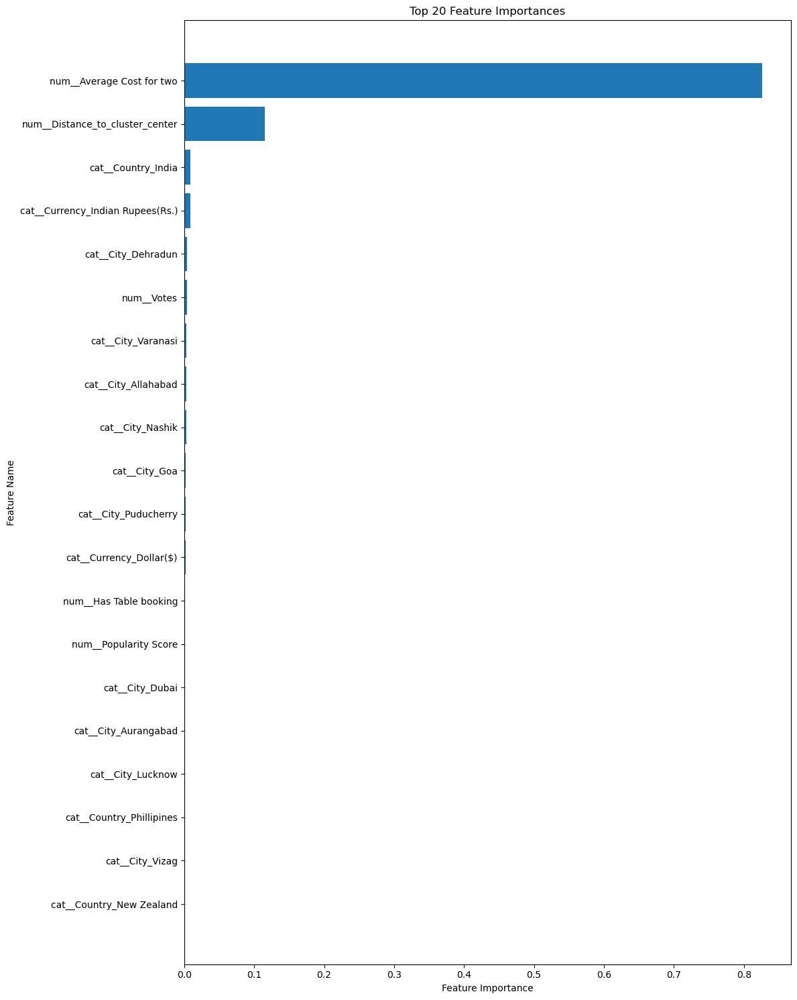

In [43]:
# Feature Importance Analysis
final_model.fit(X_preprocessed, y2)
feature_names = preprocessor.get_feature_names_out()
feature_names = [name.encode('ascii', 'ignore').decode('ascii') for name in feature_names]
feature_importance_dict = dict(zip(feature_names, feature_importances))
sorted_features = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)
sorted_feature_names, sorted_importances = zip(*sorted_features)
top_n = 20
sorted_feature_names_top = sorted_feature_names[:top_n]
sorted_importances_top = sorted_importances[:top_n]

plt.figure(figsize=(12, 15))
plt.barh(range(len(sorted_importances_top)), sorted_importances_top, align='center')
plt.yticks(range(len(sorted_importances_top)), [name[:50] + '...' if len(name) > 50 else name for name in sorted_feature_names_top])
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.title('Top 20 Feature Importances')
plt.gca().invert_yaxis() 
plt.tight_layout()
plt.show()

The "num_Average Cost for two" feature has the highest importance, indicating it's the most significant predictor in the model.

Proximity to a significant point, "num_Distance_to_cluster_center," is the second most crucial feature, underscoring the model's spatial sensitivity.

Country-specific factors, particularly being in India, and the local currency, Indian Rupees, rank as important predictors, affecting the model's output substantially.

Various cities within India and some international locations like the Philippines and New Zealand also feature in the top predictors, highlighting the model's diverse geographical applicability.

The number of votes and the availability of table booking, while less critical than other features, still provide some predictive power to the model.

# Gradient Boosting Classifier Model Deployment/Saving

In [44]:
from joblib import dump, load
dump(final_model, 'predicting_price_range.joblib')

['predicting_price_range.joblib']

In [45]:
from joblib import dump, load
loaded_model = load('predicting_price_range.joblib')

# Project Summary

This project embarked on an extensive analysis of the Zomato dataset, which encompasses a wide range of restaurants across various global locations. The objective was to dissect and predict two main aspects: the average cost for two and the price range of restaurants. Through a series of meticulous data exploration, preprocessing, and model development steps, significant insights were gleaned, serving to guide both food enthusiasts and restaurateurs in their decision-making processes.

Key Highlights:
Data Preparation and Analysis: The dataset, composed of 9,551 restaurant listings, underwent thorough preprocessing, including handling missing values and feature engineering, to prepare it for modeling. Notable attributes such as cuisine types, ratings, votes, and geographical data were analyzed to understand their distribution and impact.

Model Development for Average Cost Prediction: A series of regression models were explored for predicting the average cost for two. The Support Vector Machine (SVR) model, with specific parameters (C=10 and gamma='scale'), emerged as the best fit, achieving the lowest mean squared error (MSE) through rigorous cross-validation and hyperparameter tuning.

Model Development for Price Range Classification: For predicting the price range, classification models were employed, with the Gradient Boosting Classifier outshining others in accuracy and consistency. Through hyperparameter optimization, a model configuration that maximized prediction accuracy was identified, demonstrating exceptional performance in classifying the price range of restaurants.

Insights and Deployment: The project uncovered diverse culinary preferences across different regions and highlighted the significance of cuisines and geographical location in determining restaurant pricing strategies. The final models were saved and deployed for predicting the average cost for two and the price range, providing actionable insights for stakeholders.

Evaluation and Feature Importance: Both models were evaluated using metrics such as R^2 score and accuracy, respectively, with feature importance analysis revealing critical predictors like cuisines, table booking availability, and location-specific attributes.

Conclusion:
The comprehensive exploration and analysis of the Zomato dataset illuminated the multifaceted culinary landscape, uncovering patterns and trends that influence restaurant pricing and popularity. By harnessing machine learning techniques, this project demonstrated the capability to predict significant business outcomes, namely the average cost for two and the restaurant price range, with remarkable accuracy. These findings not only cater to the curiosity of food enthusiasts but also empower restaurateurs with data-driven insights for strategic decision-making.